In [6]:
#from PIL import Image
import os
import pandas as pd
import numpy as np
import datasets
from datasets import Dataset
from datasets import load_dataset
import json
import pickle
import matplotlib.pyplot as plt 
import sys
sys.path.append(os.path.abspath(".."))
# we get a lot of annoying warnings from sklearn so we suppress them
import warnings
warnings.filterwarnings('ignore')

## Loading data

We load the SMK data in two different formats:

- df: Pandas DataFrame with SMK metadata on paintings and canonicity

- ds: HuggingFace dataset with same columns as pandas DF, but also a column storing a PIL image of the painting (mainly used here as it's easy to check the painting when it's stored in a ds)

In [7]:
# read df from pickle 
data_path = os.path.join('..', 'data')
df = pd.read_pickle(os.path.join(data_path, 'smk_canon_paintings.pkl'))

In [8]:
# load image data
ds = load_dataset("louisebrix/smk_canon_paintings", split="train") # all the data is in the 'train' split

In [9]:
# inspect dataframe
df.head()

,smk_id,period,start_year,title,first_artist,all_artists,num_artists,main_type,all_types,image_thumbnail,...,literary_reference,object_history_note,exhibition_venues,smk_exhibitions,ex_years,exb_canon,prod_diff,prod_notes,prod_year,total_canons
0,KMS8884,1835,1835,Parti af torvet i Amalfi,Martinus Rørbye,[Martinus Rørbye],1,Maleri,[Maleri],https://iip-thumb.smk.dk/iiif/jp2/tt44ps41w_km...,...,<NA>,<NA>,"[Petit Palais, Sølvgade, Nationalmuseum, Stock...",canon,"[2020, 2019, 2019]",canon,0,[Værkdatering: 1835],1835,canon
1,KMS4313,1870,1870,Leonora Christina i fængslet,Kristian Zahrtmann,[Kristian Zahrtmann],1,Maleri,[Maleri],https://iip-thumb.smk.dk/iiif/jp2/7d278w98c_KM...,...,<NA>,<NA>,"[Den Hirschsprungske Samling, Ribe Kunstmuseum...",other,"[2006, 2019, 2019, 2020, 2016, 2016]",canon,0,[Værkdatering: 1870],1870,canon
2,KMS3880,1800,1800,Jurisprudensen. Allegorisk figur,Nicolai Abildgaard,[Nicolai Abildgaard],1,Maleri,[Maleri],https://iip-thumb.smk.dk/iiif/jp2/mw22v869s_KM...,...,<NA>,[På auktion efter Abildgaards enke solgt til J...,"[Louvre, Hamburger Kunsthalle, Sølvgade, Nasjo...",canon,"[2008, 2009, 2009, 1992, 1989, 1964]",canon,0,[Værkdatering: 1800],1800,canon
3,KMS7591,1800,1800,Filosofien,Nicolai Abildgaard,[Nicolai Abildgaard],1,Maleri,[Maleri],https://iip-thumb.smk.dk/iiif/jp2/3x816q91r_KM...,...,<NA>,<NA>,"[Louvre, Hamburger Kunsthalle, Sølvgade, Det K...",canon,"[2008, 2009, 2009, 2001]",canon,0,[Værkdatering: 1800],1800,canon
4,KMS3769,1844,1844,Udsigt fra Athenatemplet på Akropolis,Martinus Rørbye,[Martinus Rørbye],1,Maleri,[Maleri],https://iip-thumb.smk.dk/iiif/jp2/w0892f396_KM...,...,<NA>,<NA>,<NA>,other,<NA>,other,0,[Værkdatering: 1844],1844,canon


### Sanity check image embeddings

Image embeddings are obtained by running the scripts 'src/smk_embeddings.py' and 'src/greyscale_embeddings.py'. The pretrained model used is EVA-02-CLIP, a multimodal vision transformer architecture. The embeddings are saved as .npy files in the /data folder but can be found as columns in the dataframe. There's two types of embeddings:
- color embeddings: 'as they are' i.e., embeddings extracted from the downloaded image from SMK
- greyscaled embeddings: all images have been converted to greyscale before extracting embeddings from them

As a type of sanity check, we make sure that our embeddings actually capture image content and style by running a kNN algorithm to find the nearest neighbors based on embeddings:

0     945
1     494
2    1027
3      81
4    1405
5    1277
6     218
7     991
8     159
Name: index, dtype: int64


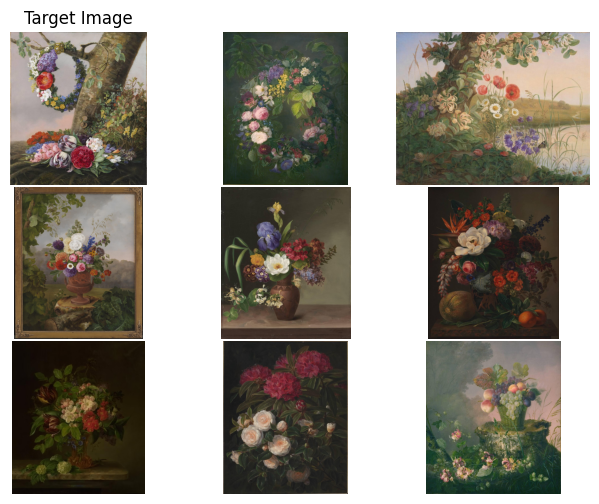

In [10]:
from src.utils import plot_neighbors

feature_list = np.array(df['embedding'].tolist())
plot_neighbors(feature_list, 80, ds) # choose random image as target image

0     945
1    1027
2     159
3     933
4     494
5    1405
6    1618
7     902
8    1473
Name: index, dtype: int64


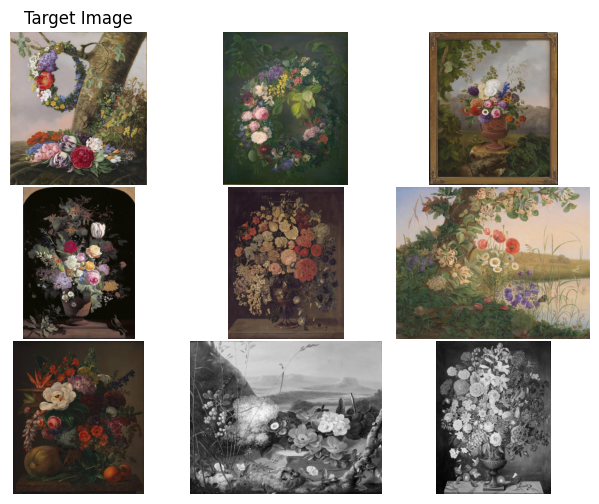

In [11]:
grey_feature_list = np.array(df['grey_embedding'].tolist())
plot_neighbors(grey_feature_list, 80, ds) # choose random image as target image

### Create subset of colored images only

Throughout the notebook, we'll work with seperate subsets of colored embeddings and greyscaled embeddings

In [12]:
# make subset of colored images only 
color_subset = df.query('rgb == "color"')
color_idx = color_subset.index.tolist()
ds_color = ds.select(color_idx)
color_subset.reset_index(drop=True, inplace=True)

# Analysis

## Synchronic Comparison

We intially inspect groupings in our data with PCA and dendrograms.

Code is adapted from Feldkamp et al. (2024) (https://aclanthology.org/2024.nlp4dh-1.14/)

#### PCA plots per canon category

Text(0.5, 0.95, 'PCA by canon category')

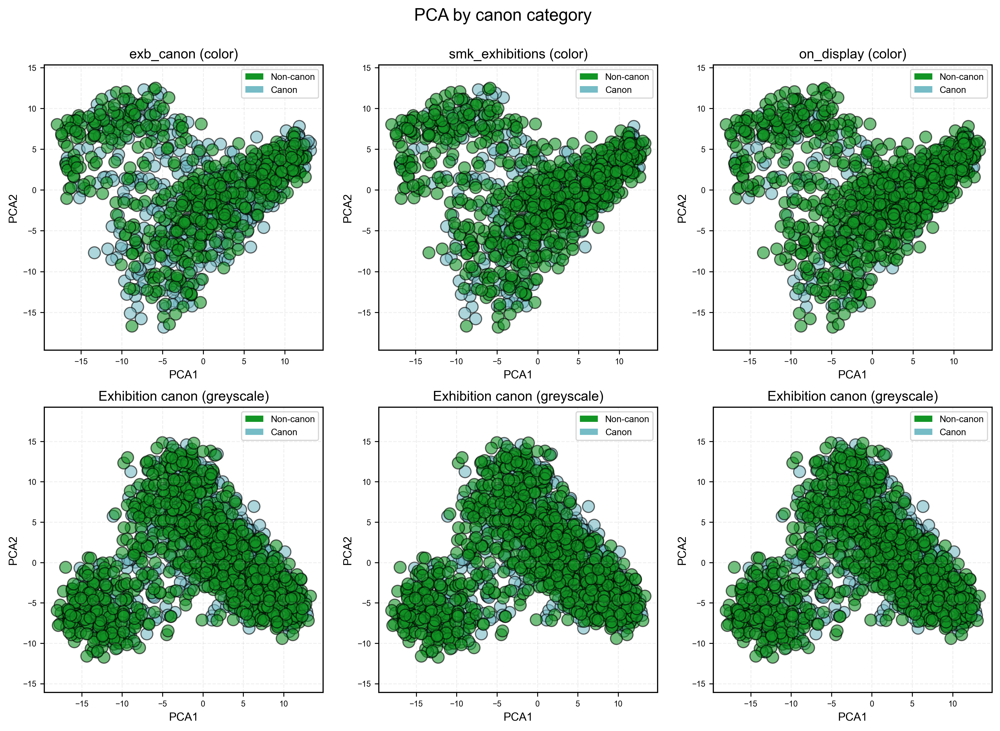

In [13]:
# PCA plots with binary canon variables
from src.analyses_utils import pca_binary
fig, axs = plt.subplots(2, 3, figsize=(15, 10))

canon_cols = ['exb_canon', 'smk_exhibitions', 'on_display']

for idx, col in enumerate(canon_cols):

    pca_binary(ax = axs[0, idx], 
                    df = color_subset, 
                    embedding = 'embedding', 
                    canon_category = col, 
                    title = f"{col} (color)")

    pca_binary(ax = axs[1, idx], 
                    df = df, 
                    embedding = 'grey_embedding', 
                    canon_category = 'exb_canon', 
                    title = "Exhibition canon (greyscale)")

fig.suptitle('PCA by canon category', size = 15, y=0.95)

#### Dendrograms

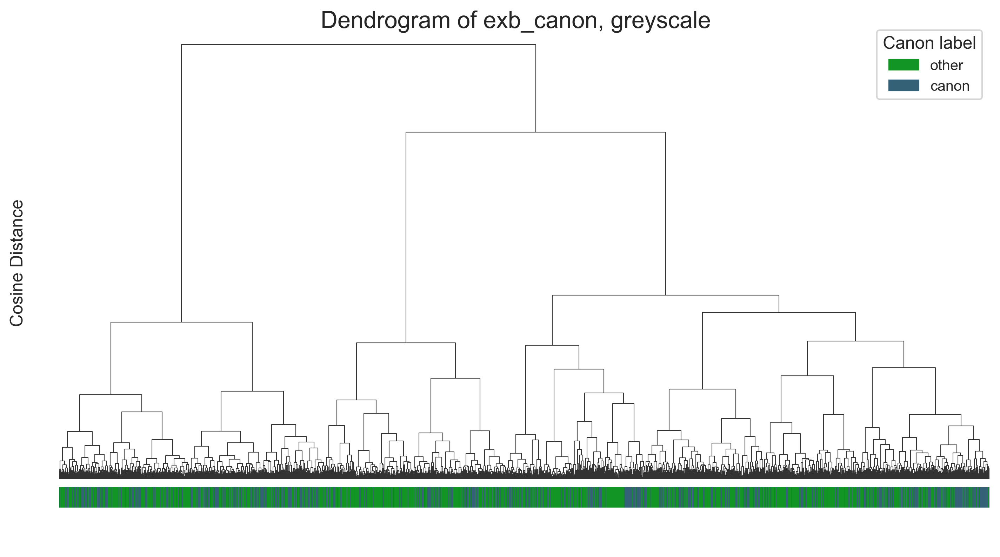

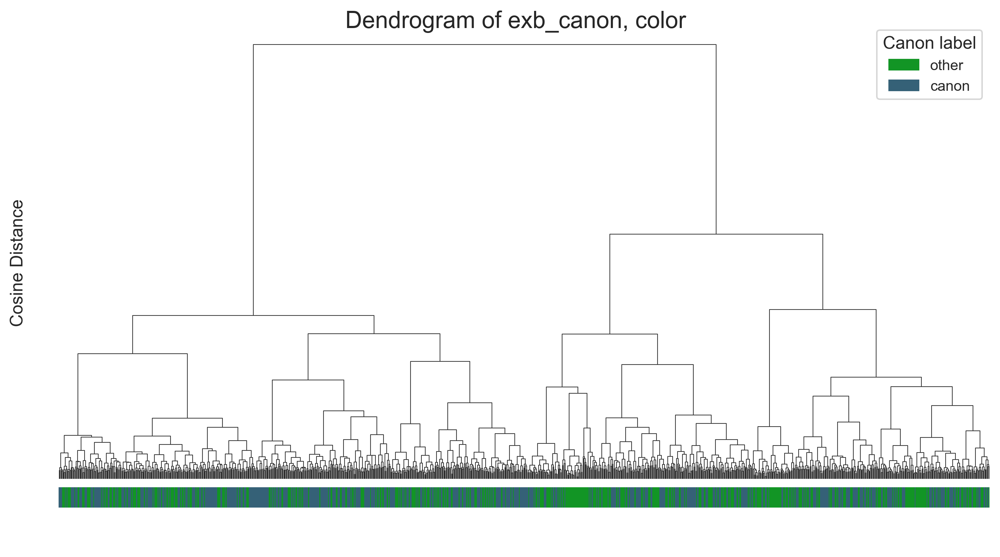

In [15]:
from src.utils import plot_bar_dendrogram

# plot greyscale
plot_bar_dendrogram(df, 'exb_canon', 'grey_embedding', 10, 6, f'Dendrogram of exb_canon, greyscale')

# plot color
plot_bar_dendrogram(color_subset, 'exb_canon', 'embedding', 10, 6, f'Dendrogram of exb_canon, color')

## Diachronic Change

We inspect temporal changes in embeddings through inter-group (canon vs non-canon) and intra-group (within canon-groups) with cosine similarities of embeddings:

(Code is adapted from Feldkamp et al. (2024) (https://aclanthology.org/2024.nlp4dh-1.14/))

In [16]:
from src.analyses_utils import plot_grid, plot_diachronic_change

#### Intra-group, canon

Plotting canon columns for CANON_COSIM_MEAN: 100%|██████████| 3/3 [01:08<00:00, 22.91s/it]


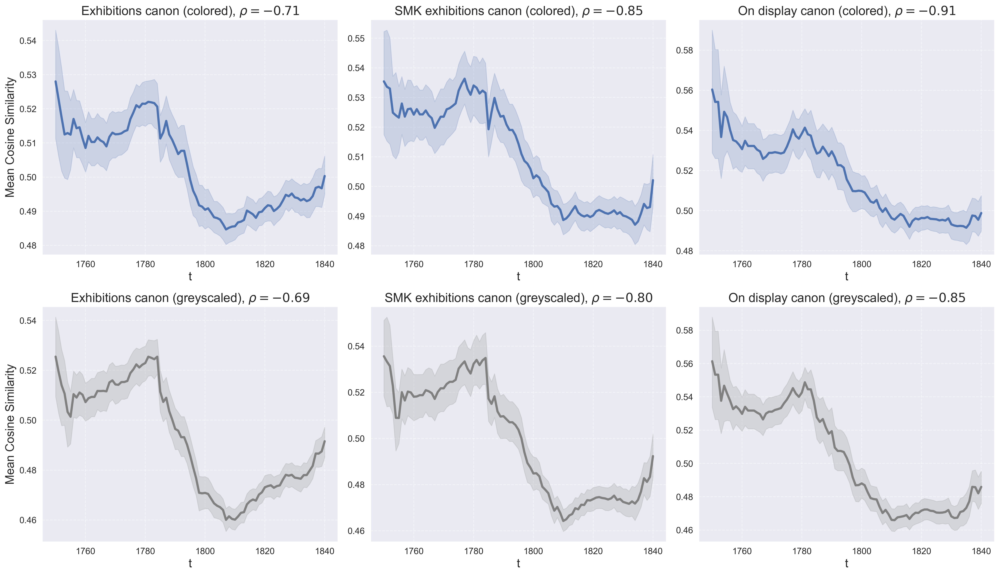

In [18]:
plot_grid(df = df,
           color_subset=color_subset, 
            canon_cols = canon_cols,
            w_size= 30, 
            cosim_to_plot='CANON_COSIM_MEAN', 
            savefig=False,
            filename='')

#### Intra-group, non-canon

Plotting canon columns for NONCANON_COSIM_MEAN: 100%|██████████| 3/3 [01:09<00:00, 23.02s/it]


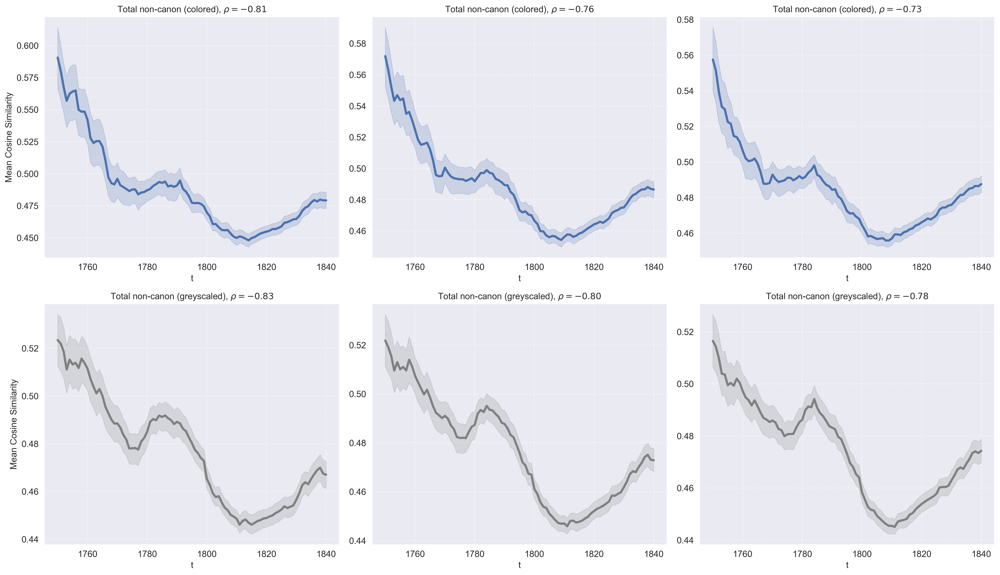

In [19]:
plot_grid(df = df, 
        color_subset = color_subset, 
        canon_cols = canon_cols,
        w_size= 30, 
        cosim_to_plot='NONCANON_COSIM_MEAN',
        savefig=False,
        filename='')

#### Intra-group, total non-canon

Text(0, 0.5, '')

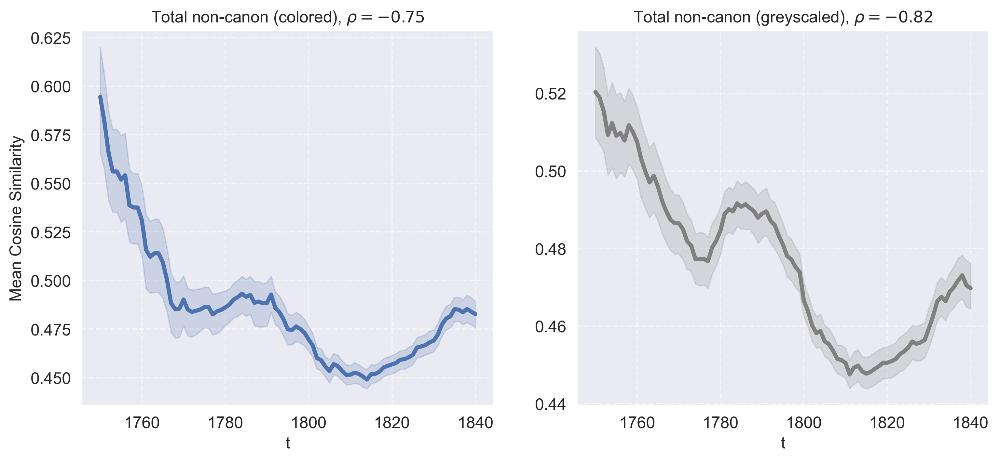

In [20]:
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

plot_diachronic_change(w_size = 30, 
                df = color_subset, 
                canon_col = 'total_canons', 
                embedding_col = 'embedding', 
                cosim_to_plot = 'NONCANON_COSIM_MEAN', 
                ax = axs[0])

plot_diachronic_change(w_size = 30, 
               df = df, 
            canon_col = 'total_canons', 
             embedding_col = 'grey_embedding', 
             cosim_to_plot = 'NONCANON_COSIM_MEAN', 
              ax = axs[1])

    # remove y label from second plot
axs[1].set_ylabel("")

#### Inter-group

Plotting canon columns for CANON_NONCANON_COSIM: 100%|██████████| 3/3 [01:01<00:00, 20.37s/it]


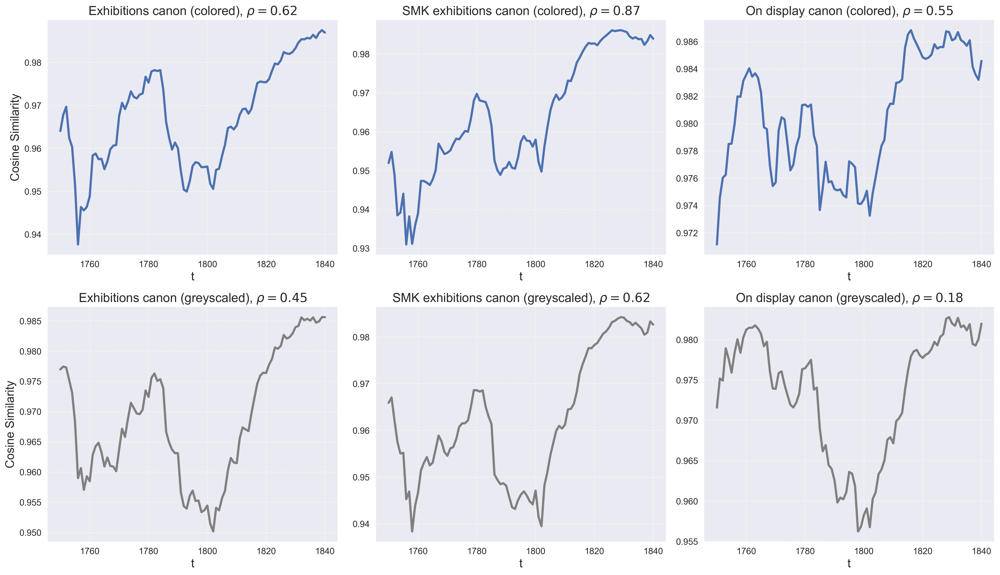

In [21]:
# inter-group
plot_grid(df = df, 
           color_subset = color_subset, 
          canon_cols = canon_cols,
         w_size= 30, 
        cosim_to_plot='CANON_NONCANON_COSIM', 
      savefig=False,
     filename='')

## Classification

The following runs two separate classification models, a Logistic Regression and MLP classifier. Both models are furthermore run with and without balancing the classes

In [22]:
from src.analyses_utils import save_classification_results

In [ ]:
models = ['logistic', 'mlp'] # specify models
sampling_methods = [False, True] # do not apply / apply balancing of classes

# run for both greyscale and color data
save_classification_results(canon_cols=canon_cols, 
                                models=models, 
                                sampling_methods=sampling_methods, 
                                df=df, 
                                embedding_col='grey_embedding', 
                                col_or_grey='greyscale', 
                                report_suffix='test', 
                                out_folder=os.path.join('..', 'results', 'classification_results'))

save_classification_results(canon_cols=canon_cols, 
                                models=models, 
                                sampling_methods=sampling_methods, 
                                df=df, 
                                embedding_col='embedding', 
                                col_or_grey='color', 
                                report_suffix='test', 
                                out_folder=os.path.join('..', 'results', 'classification_results'))

CLASSIFICATION RESULTS, greyscale (MEAN 10-FOLD CV MACRO F1 SCORES):
+--------------+------------------+---------------+-------------+--------------+
|              | unbalanced_logis | balanced_logi | unbalanced_ | balanced_mlp |
|              |       tic        |     stic      |     mlp     |              |
+--------------+------------------+---------------+-------------+--------------+
|  exb_canon   |      0.681       |     0.687     |    0.699    |    0.703     |
+--------------+------------------+---------------+-------------+--------------+
| smk_exhibiti |      0.658       |     0.615     |    0.667    |    0.647     |
|     ons      |                  |               |             |              |
+--------------+------------------+---------------+-------------+--------------+
|  on_display  |      0.638       |     0.579     |    0.628    |    0.587     |
+--------------+------------------+---------------+-------------+--------------+
CLASSIFICATION RESULTS, color (MEAN 10-F